The codes for split it to traning, testing, validating are available at utility/mat_data.py create_WDC_dataset(). 

Run the createDCmall() function in utility/lmdb_data.py to generate training lmdb dataset. 

To generate testing files with noise, replace the srcdir and dstdir in utility/generate_case.py and run utility/generate_case.py.

In [22]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scipy.io
import xarray as xr
import rasterio
from rasterio.transform import from_origin
from hypso import Hypso1
from skimage import io
from osgeo import gdal
import warnings
from rasterio.errors import NotGeoreferencedWarning
import torch
import lmdb
from utility.util import *
warnings.filterwarnings("ignore", category=NotGeoreferencedWarning)

In [21]:
dir_path = '/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO2/'
wdc_path = '/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/WDC/'
gloria_path= '/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/GLORIA/'

hypso_result_case1='./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case1.mat'
hypso_result_case2='./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case2.mat'
hypso_result_case3='./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case3.mat'
hypso_result_case4='./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case4.mat'
hypso_result_case5='./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case5.mat'
hypso_result2_case5='./data/HSI_Data/Hyperspectral_Project/HYPSO2/results2/hypersigma/hypersigma_Case5.mat'

gloria_nc=gloria_path+'gloria_2024-09-24T08-30-46Z-l1a.nc'
gloria_tif=gloria_path+'gloria_2024-09-24T08-30-46Z-l1a.tif'
gloria_mat=gloria_path+'gloria_2024-09-24T08-30-46Z-l1a.mat'
gloria_Q_mat=gloria_path+'gloria_2024-09-24T08-30-46Z-l1a_Quantile.mat'
gloria_simple_mat=gloria_path+'gloria_2024-09-24T08-30-46Z-l1a_simple.mat'

dc_tif=wdc_path+'dc.tif'
hypso1_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1a.tif'
hypso2_tif='./data/HSI_Data/Hyperspectral_Project/HYPSO2/vb_a.tif'

In [23]:
def process_hypso_images(dir_path, image_name, image_name2):
    """
    Processes HYPSO images and saves them as GeoTIFF files.

    Parameters:
    - dir_path: str, directory path where the images and points file are located.
    - image_name: str, base name of the first image file (without extension).
    - image_name2: str, base name of the second image file (without extension).
    """
    l1a_nc_file = os.path.join(dir_path, image_name + '.nc')
    # points_file = os.path.join(dir_path, 'sift-bin.points')
    
    if not os.path.exists(l1a_nc_file):
        raise FileNotFoundError(f"The file {l1a_nc_file} does not exist.")
    # if not os.path.exists(points_file):
    #     raise FileNotFoundError(f"The file {points_file} does not exist.")
    
    # Create Satellite Object
    satobj = Hypso1(path=l1a_nc_file, verbose=True)
    # satobj.load_points_file(path=points_file, image_mode='standard', origin_mode='qgis')
    
    l1a_cube = satobj.get_l1a_cube()
    height, width, bands = l1a_cube.shape
    
    satobj.generate_l1b_cube()
    l1b_cube = satobj.get_l1b_cube()
    height_b, width_b, bands_b = l1b_cube.shape
    
    # Define the output GeoTIFF file paths
    output_tif = os.path.join(dir_path, image_name + '.tif')
    output_tif2 = os.path.join(dir_path, image_name2 + '.tif')
    
    # Save the first image as a GeoTIFF file
    with rasterio.open(
        output_tif,
        'w',
        driver='GTiff',
        height=height,
        width=width,
        count=bands,
        dtype='uint16',
        crs=None
    ) as dst:
        for i in range(bands):
            dst.write(l1a_cube[:, :, i], i + 1)
    
    # Save the second image as a GeoTIFF file
    with rasterio.open(
        output_tif2,
        'w',
        driver='GTiff',
        height=height_b,
        width=width_b,
        count=bands_b,
        dtype='uint16',
        crs=None
    ) as dst:
        for i in range(bands_b):
            dst.write(l1b_cube[:, :, i], i + 1)

def transpose_geotiff(input_path):
    """
    Transposes a GeoTIFF image and saves the result to a new file.
    
    Parameters:
    - input_path: str, path to the input GeoTIFF file.
    """
    output_path = input_path.replace('.tif', '_transposed.tif')
    with rasterio.open(input_path) as src:
        # Read the image data
        image_data = src.read()
        print(f"Original shape: {image_data.shape}")
        
        # Transpose the image data
        transposed_data = image_data.transpose((0, 2, 1))
        
        print(f"Shape after transposing: {transposed_data.shape}")
        # Update the metadata to reflect the new dimensions
        metadata = src.meta.copy()
        metadata.update({
            'height': transposed_data.shape[1],
            'width': transposed_data.shape[2],
            'count': transposed_data.shape[0]
        })
        # Write the transposed image to a new file
        with rasterio.open(output_path, 'w', **metadata) as dst:
            dst.write(transposed_data)

def resize_geotiff(input_path, desired_bands, desired_height, desired_width, padding_value=0):
    """
    Resizes a GeoTIFF image by cropping or padding to the desired dimensions.
    
    Parameters:
    - input_path: str, path to the input GeoTIFF file.
    - desired_bands: int, desired number of bands in the output image.
    - desired_height: int, desired height of the output image.
    - desired_width: int, desired width of the output image.
    - padding_value: int, value to use for padding (default is 0).
    """
    output_path = input_path.replace('.tif', '_resized.tif')
    
    with rasterio.open(input_path) as src:
        # Read the image data
        image_data = src.read()
        original_bands, original_height, original_width = image_data.shape
        
        # Crop or pad the bands
        if desired_bands < original_bands:
            image_data = image_data[:desired_bands, :, :]
        elif desired_bands > original_bands:
            band_padding = desired_bands - original_bands
            image_data = np.pad(
                image_data,
                ((0, band_padding), (0, 0), (0, 0)),
                mode='constant',
                constant_values=padding_value
            )
        
        # Crop or pad the height and width
        if desired_height < original_height:
            image_data = image_data[:, :desired_height, :]
        elif desired_height > original_height:
            height_padding = desired_height - original_height
            image_data = np.pad(
                image_data,
                ((0, 0), (0, height_padding), (0, 0)),
                mode='constant',
                constant_values=padding_value
            )
        
        if desired_width < original_width:
            image_data = image_data[:, :, :desired_width]
        elif desired_width > original_width:
            width_padding = desired_width - original_width
            image_data = np.pad(
                image_data,
                ((0, 0), (0, 0), (0, width_padding)),
                mode='constant',
                constant_values=padding_value
            )
        
        # Update the metadata to reflect the new dimensions
        metadata = src.meta.copy()
        metadata.update({
            'count': desired_bands,
            'height': desired_height,
            'width': desired_width
        })
        
        # Write the resized image to a new file
        with rasterio.open(output_path, 'w', **metadata) as dst:
            dst.write(image_data)

def print_geotiff_info(file_path):
    # Open the GeoTIFF file
    print("--------------------")
    print(f"FILE: {os.path.basename(file_path)}")
    
    with rasterio.open(file_path) as dataset:
        img=dataset.read()
        # print(f"Metadata: {dataset.meta}")
        print(f"raster shape:   {img.shape}")
        # print(f"raster Shape: {dataset.shape}")
        # print(f"raster width: {dataset.width}")
        # print(f"raster height: {dataset.height}")
        # print(f"raster count: {dataset.count}")
    # Calculate and print the max and min values of the spectral values in the bands
    max_value = img.max()
    min_value = img.min()
    print(f"Max spectral value: {max_value}")
    print(f"Min spectral value: {min_value}")
    dataset = gdal.Open(file_path)
    array = dataset.ReadAsArray()
    print(f"gdal shape:     {array.shape}")
    
    ioimage = io.imread(file_path, plugin='tifffile')
    print(f"skimage shape:  {ioimage.shape}") 

def plot_geotiff(file_path, band_index=20):
    """
    Plots the specified band of a GeoTIFF file.
    
    Parameters:
    - file_path: str, path to the GeoTIFF file.
    - band_index: int, index of the band to plot (default is 50).
    """
    # Open the GeoTIFF file
    with rasterio.open(file_path) as src:
        # Read the specified band
        band = src.read(band_index)
        
        # Plot the band
        plt.imshow(band, cmap='Spectral')
        plt.title(f'{os.path.basename(file_path)} Band {band_index}')
        plt.axis('off')
        plt.show()
    
def slice_and_save_mat_image(input_path, cube_size=64):
    """
    Slices a .mat image into 64x64 cubes and saves them with the same keys and bands as the original.
    
    Parameters:
    - input_path: str, path to the input .mat file.
    - cube_size: int, size of the cubes (default is 64).
    """
    # Load the .mat file
    data = scipy.io.loadmat(input_path)
    
    # Extract the keys and their corresponding arrays
    keys = [key for key in data.keys() if not key.startswith('__')]
    arrays = {key: data[key] for key in keys}
    
    # Determine the output directory
    output_dir = input_path.replace('Cases', 'Patch_Cases').replace('test.mat', '')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Initialize a counter for the output files
    counter = 0
    
    # Get the shape of the arrays (assuming all arrays have the same shape)
    _, height, width = next(iter(arrays.values())).shape
    
    # Extract the case name from the input path
    case_name = os.path.basename(os.path.dirname(input_path))
    print(f"Processing {case_name}")
    print(f"Case image shape: {next(iter(arrays.values())).shape}")
    
    # Slice the arrays into cubes and save them
    for i in range(0, height, cube_size):
        for j in range(0, width, cube_size):
            # Create a dictionary to save the cube with the same keys
            cube_dict = {}
            for key in keys:
                array = arrays[key]
                cube = array[:, i:i+cube_size, j:j+cube_size]
                
                # Ensure the cube has the correct dimensions
                if cube.shape[1] == cube_size and cube.shape[2] == cube_size:
                    cube_dict[key] = cube
            
            if cube_dict:
                # Print cube shape and starting corner coordinates
                print(f"Cube shape: {cube.shape}, Starting corner: ({i}, {j})")
                
                # Determine the output file path
                output_path = os.path.join(output_dir, f'test_{counter}.mat')
                
                # Save the cube as a .mat file
                scipy.io.savemat(output_path, cube_dict)
                
                # Increment the counter
                counter += 1

def plot_rgb_composite(path, keys, red_band=69, green_band=46, blue_band=26, output=False):
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 3D arrays using the provided keys
    rgb_images = []
    for key in keys:
        array = data[key]
        if output:
            red = array[:, :, red_band]
            green = array[:, :, green_band]
            blue = array[:, :, blue_band]
        else:
            red = array[red_band, :, :]
            green = array[green_band, :, :]
            blue = array[blue_band, :, :]
        rgb_image = np.stack((red, green, blue), axis=-1)
        rgb_images.append(rgb_image)
    
    # Plot the images side by side
    if len(rgb_images) == 1:
        plt.imshow(rgb_images[0])
        plt.title(f'{keys[0]}')
        plt.axis('off')
    else:
        fig, axes = plt.subplots(1, len(rgb_images), figsize=(15, 5))
        for ax, rgb_image, key in zip(axes, rgb_images, keys):
            ax.imshow(rgb_image)
            ax.set_title(f'{key}')
            ax.axis('off')
    # Include the shape of 'gt' as a label
    if 'gt' in keys:
        gt_shape = data['gt'].shape
        plt.figtext(0.5, 0.01, f'Shape of gt: {gt_shape} | File: {os.path.basename(path)}', ha='center', fontsize=12)
    
    plt.show()

def compare_average_spectrum(image_path, key1, key2, key3=None, patch_coords=None):
    """
    Compares the average spectrum of a patch in two or three hyperspectral images and plots the results.

    Parameters:
    - image_path: str, path to the hyperspectral image (.mat file).
    - key1: str, key for the first hyperspectral data array in the .mat file.
    - key2: str, key for the second hyperspectral data array in the .mat file.
    - patch_coords: tuple, coordinates of the patch (start_height, end_height, start_width, end_width).
    - key3: str, optional key for the third hyperspectral data array in the .mat file.
    """
    # Load the .mat file
    data = scipy.io.loadmat(image_path)
    
    # Extract the hyperspectral data arrays
    array1 = data[key1]
    array2 = data[key2]
    
    # If no patch coordinates are provided, consider the whole image
    if patch_coords is None:
        patch_coords = (0, array1.shape[0], 0, array1.shape[1])
    
    # Extract the patch from both images
    start_height, end_height, start_width, end_width = patch_coords
    patch1 = array1[start_height:end_height, start_width:end_width, :]
    patch2 = array2[start_height:end_height, start_width:end_width, :]
    
    # Calculate the average spectrum for each patch
    avg_spectrum1 = np.mean(patch1, axis=(0, 1))
    avg_spectrum2 = np.mean(patch2, axis=(0, 1))
    
    # Plot the average spectra
    plt.figure(figsize=(10, 6))
    plt.plot(avg_spectrum1, label=key1)
    plt.plot(avg_spectrum2, label=key2)
    
    if key3:
        array3 = data[key3]
        patch3 = array3[start_height:end_height, start_width:end_width, :]
        avg_spectrum3 = np.mean(patch3, axis=(0, 1))
        plt.plot(avg_spectrum3, label=key3)
    
    plt.xlabel('Band')
    plt.ylabel('Average Spectrum Value')
    plt.title('Comparison of Average Spectrum in the Patch')
    plt.legend()
    plt.title(f'Comparison of Average Spectrum in the Patch {patch_coords} for {os.path.basename(image_path)}')
    plt.show()

def compare_spectral_range(image_paths, key, start_band, end_band):
    """
    Compares the spectral range of a specific key in multiple .mat images and plots the results.

    Parameters:
    - image_paths: list of str, paths to the .mat files.
    - key: str, key for the hyperspectral data array in the .mat files.
    - start_band: int, starting band index for the spectral range.
    - end_band: int, ending band index for the spectral range.
    """
    avg_spectra = []
    file_names = []

    for image_path in image_paths:
        # Load the .mat file
        data = scipy.io.loadmat(image_path)
        
        
        # Extract the hyperspectral data array
        array = data[key]
        
        # Extract the spectral range
        spectral_range = array[:, :, start_band:end_band]
        
        # Calculate the average spectrum for the spectral range
        avg_spectrum = np.mean(spectral_range, axis=(0, 1))
        avg_spectra.append(avg_spectrum)
        file_names.append(os.path.basename(image_path))
        
        # Calculate and print the max and min spectral values in any pixel in the image
        max_spectral_value = np.max(array)
        min_spectral_value = np.min(array)
        print(f"Max spectral value in {os.path.basename(image_path)}: {max_spectral_value}")
        print(f"Min spectral value in {os.path.basename(image_path)}: {min_spectral_value}")

    # Plot the average spectra
    plt.figure(figsize=(10, 6))
    for avg_spectrum, file_name in zip(avg_spectra, file_names):
        plt.plot(avg_spectrum, label=file_name)
    
    # Check if the images are identical
    if len(avg_spectra) > 1 and all(np.array_equal(avg_spectra[0], spectrum) for spectrum in avg_spectra[1:]):
        print("Warning: All images are identical.")
    
    plt.xlabel('Band')
    plt.ylabel('Average Spectrum Value')
    plt.title(f'Comparison of Average Spectrum in the Spectral Range {start_band}-{end_band}')
    plt.legend()
    
    # Calculate the spot of most divergence
    if len(avg_spectra) > 1:
        divergence = np.abs(avg_spectra[0] - avg_spectra[1])
        max_divergence_index = np.argmax(divergence)
        max_divergence_value = divergence[max_divergence_index]
        
        # Print the divergence
        print(f"Max divergence at band {max_divergence_index} with a value of {max_divergence_value:.2f}")
        
        # Plot the spot of most divergence
        plt.axvline(x=max_divergence_index, color='r', linestyle='--', label=f'Max Divergence at Band {max_divergence_index} (Δ={max_divergence_value:.2f})')
    
    plt.show()

def plot_hyperspectral_output(path, num_rows=3, num_cols=4, cmap='plasma'):
    """
    - Common colormaps include: 'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'gray', 'hot', 'cool', 'spring', 'summer', 'autumn', 'winter'.
    """
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 'output' key
    output_data = data['output']
    
    # Plot the output data for 12 bands with equal spacing
    num_bands = output_data.shape[2]
    num_plots = num_rows * num_cols
    spacing = num_bands // num_plots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    
    for i, ax in enumerate(axes.flat):
        band_index = i * spacing
        if band_index < num_bands:
            ax.imshow(output_data[:, :, band_index], cmap=cmap)
            ax.set_title(f'Output of {path.split("/")[-1]} - Band {band_index}')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

def visualize_slices(shape, slices, slice_names):
    """
    Visualizes different slices of an image.

    Parameters:
    - shape: tuple, the shape of the image (bands, height, width).
    - slices: list of tuples, each tuple contains the slice indices (start_band, end_band, start_height, end_height, start_width, end_width).
    - slice_names: list of str, names of the slices for the legend.
    """
    # Create a base image with the same dimensions as the original image
    base_image = np.zeros((shape[1], shape[2]))

    # Assign different values to different slices for visualization
    for i, (start_band, end_band, start_height, end_height, start_width, end_width) in enumerate(slices):
        base_image[start_height:end_height, start_width:end_width] = i + 1

    # Plot the base image with different colors for each slice
    plt.figure(figsize=(10, 10))
    plt.imshow(base_image, cmap='tab10')
    plt.title('Slices in the Original Image')
    plt.axis('on')
    plt.xlabel('Pixel X')
    plt.ylabel('Pixel Y')

    # Create a custom legend
    colors = [plt.cm.tab10(i) for i in range(len(slice_names))]
    patches = [mpatches.Patch(color=colors[i], label=slice_names[i]) for i in range(len(slice_names))]
    plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    plt.show()

def transform_tif_to_mat(tif_path):
    """
    Transforms a GeoTIFF image to a .mat file with normalization using torch tensors.

    Parameters:
    - tif_path: str, path to the input GeoTIFF file.
    """
    # Read the GeoTIFF file
    with rasterio.open(tif_path) as src:
        image_data = src.read()
    
    # Convert to torch tensor and normalize
    image_tensor = torch.tensor(image_data, dtype=torch.float)

    # # static normalization
    # image_tensor = image_tensor / 36855
    # mat_path = tif_path.replace('.tif', '_simple.mat')

    # # Simple Normalizer
    # image_tensor = (image_tensor - image_tensor.min()) / (image_tensor.max() - image_tensor.min())
    # mat_path = tif_path.replace('.tif', '.mat')
    
    # Normalizer using BandMinMaxQuantileStateful
    normalizer = BandMinMaxQuantileStateful()
    normalizer.fit([image_tensor])
    image_tensor = normalizer.transform(image_tensor).cpu()
    mat_path = tif_path.replace('.tif', '_Quantile.mat')
    
    # Prepare the data dictionary to save as .mat
    data_dict = {
        'data': image_tensor.numpy()  # Save to 'data' key
    }
    # Save the data dictionary as a .mat file
    scipy.io.savemat(mat_path, data_dict)
    print(f"Transformed {tif_path} to {mat_path}")

def plot_pixel_spectra(mat_file_path, pixel_coords=None, average_all=False):
    """
    Plots the spectral values for all bands of a pixel or average of all pixels in each image in a .mat file.

    Parameters:
    - mat_file_path: str, path to the .mat file
    - pixel_coords: tuple, (x, y) coordinates of the pixel to plot (ignored if average_all is True)
    - average_all: bool, if True, plot the average of all pixels instead of a single pixel
    """
    # Load the .mat file
    data = scipy.io.loadmat(mat_file_path)
    
    # Get the file name from the path
    file_name = os.path.basename(mat_file_path)
    
    # Iterate through all keys in the .mat file
    for key, value in data.items():
        # Skip metadata keys
        if key.startswith('__'):
            continue
        
        # Find the dimension that holds the bands (should be 120)
        band_dim = next((i for i, dim in enumerate(value.shape) if dim == 120), None)
        
        if band_dim is not None:
            if average_all:
                # Calculate the average across all pixels for each band
                spectral_values = np.mean(value, axis=tuple(i for i in range(len(value.shape)) if i != band_dim))
            else:
                # Extract the spectral values for the given pixel
                if band_dim == 0:
                    spectral_values = value[:, pixel_coords[1], pixel_coords[0]]
                elif band_dim == 2:
                    spectral_values = value[pixel_coords[1], pixel_coords[0], :]
                else:
                    spectral_values = value[pixel_coords[1], :, pixel_coords[0]]
            
            # Plot the spectral values
            plt.figure(figsize=(10, 6))
            plt.plot(spectral_values)
            if average_all:
                plt.title(f'Average Spectral Values for {key}\nFile: {file_name}')
            else:
                plt.title(f'Spectral Values for {key} at pixel {pixel_coords}\nFile: {file_name}')
            plt.xlabel('Band')
            plt.ylabel('Spectral Value')
            plt.show()
        else:
            print(f"No 120-band dimension found for key: {key} in file: {file_name}")


In [14]:
%run ./utility/mat_data.py

The shape of imggt is: (120, 598, 1092)
The shape of train_0 is: (120, 598, 200)
The shape of train_1 is: (120, 598, 200)
The shape of test is: (120, 200, 200)
The shape of val is: (120, 56, 56)


In [14]:
%run  ./utility/lmdb_data.py

create wdc...
Map size(GB): 0.23591503500938416
loading mat: train_0.mat
-------------------
Preprocessing data...
Preprocess data shape: (191, 600, 307)
zooming to 1.000000
zooming to 0.500000
zooming to 0.250000
new data 0 shape  (544, 191, 64, 64)
new data 1 shape  (360, 191, 64, 64)
new data 2 shape  (22, 191, 64, 64)
concatenating data...
new data shape after conc: (926, 191, 64, 64)
augmenting data...
Postprocess data shape: (926, 191, 64, 64)
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/WDC/wdc.db
load mat: train_0.mat
-------------------
Preprocessing data...
Preprocess data shape: (191, 600, 307)
zooming to 1.000000
zooming to 0.500000
zooming to 0.250000
new data 0 shape  (544, 191, 64, 64)
new data 1 shape  (360, 191, 64, 64)
new data 2 shape  (22, 191, 64, 64)
concatenating data...
new data shape after conc: (926, 191, 64, 64)
augmenting data...
Postprocess data shape: (926, 191, 64, 64)
load mat: train_1.mat
-------------------
Prepro

In [19]:
%run  ./utility/generate_case.py

Processing Case1, iteration 1
Input image shape: (120, 200, 200), Noisy image shape: (120, 200, 200)
Processing Case2, iteration 1
Input image shape: (120, 200, 200), Noisy image shape: (120, 200, 200)
Processing Case3, iteration 1
Input image shape: (120, 200, 200), Noisy image shape: (120, 200, 200)
Processing Case4, iteration 1
Input image shape: (120, 200, 200), Noisy image shape: (120, 200, 200)
Processing Case5, iteration 1
Input image shape: (120, 200, 200), Noisy image shape: (120, 200, 200)


In [ ]:
!bash train_complex.sh 1e-4 hypersigma 0 l2 1 ./data/HSI_Data/Hyperspectral_Project/WDC/wdc.db

In [36]:
!bash test.sh ./data/HSI_Data/Hyperspectral_Project/GLORIA/test_noise/Patch_Cases/Case5

----options----
Namespace(prefix='hypersigma_gaussian', arch='hypersigma', batchSize=16, lr=0.0001, wd=0, loss='l2', testdir='./data/HSI_Data/Hyperspectral_Project/GLORIA/test_noise/Patch_Cases/Case5', sigma=None, training_dataset_path='/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/WDC/wdc_64.db', pretrain='/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/pre_train/checkpoint-400.pth', init='kn', no_cuda=False, from_scratch=False, pretrain_path='/home/lofty/CODE/HyperSIGMA-fork/spat-base.pth', no_log=False, threads=1, seed=2018, resume=True, no_ropt=False, chop=False, resumePath='./output/original_hypersigma_1e-4_spat-base_batch4_warmup_l2_epoch_1_complex_s3_8point_HYPSO2/hypersigma_gaussian/model_latest.pth', dataroot='/data/HSI_Data/ICVL64_31.db', clip=1000000.0, gpu_ids=[0], basedir='./data/HSI_Data/Hyperspectral_Project/GLORIA/results', epoch=100, update_lr=5e-05, meta_lr=5e-05, n_way=1, k_spt=2, k_qry=5, task_num=16, update_step=5, update_step_

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.878908998036511..2.0691525163063957].


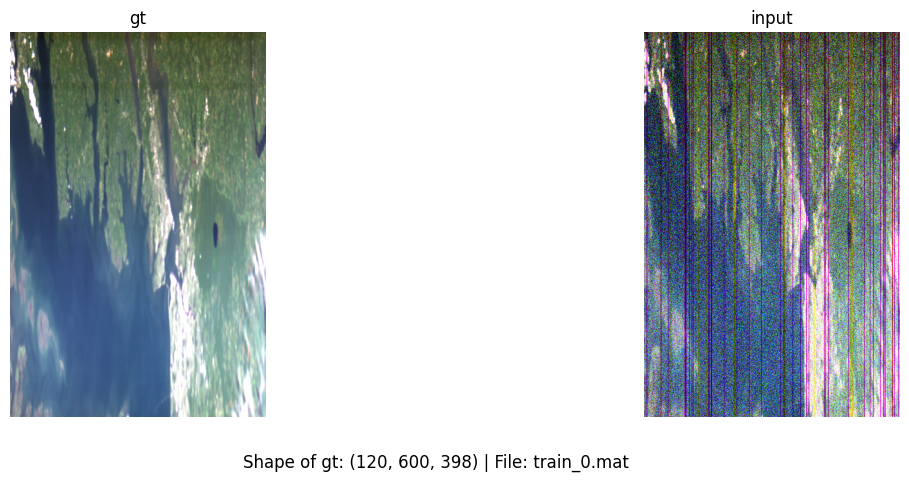

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7585061192512512..1.8814555406570435].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01633237488567829..1.1250540018081665].


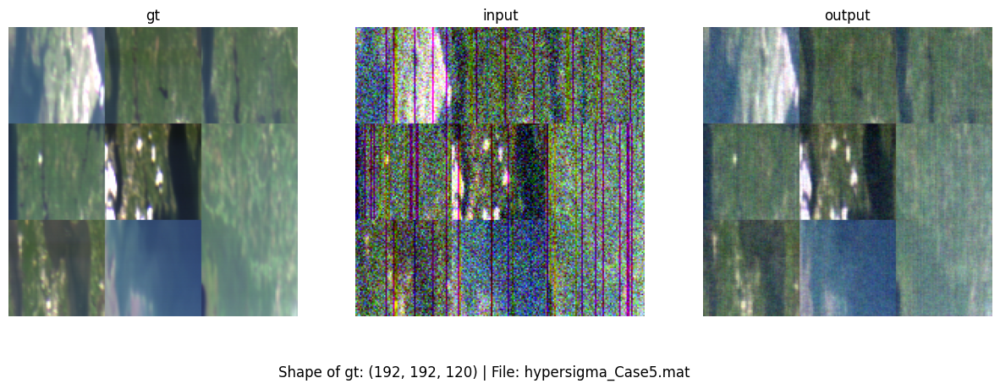

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0501947402954102..2.043506145477295].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10305630415678024..1.1883585453033447].


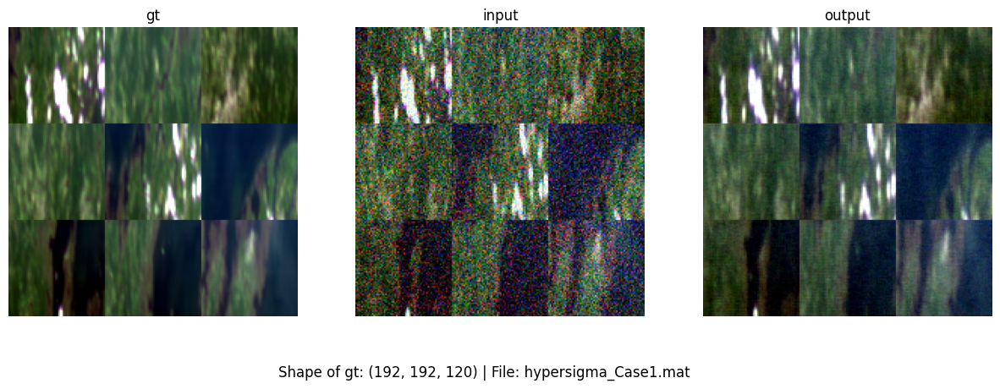

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.968149721622467..1.7691726684570312].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10982044786214828..1.212133765220642].


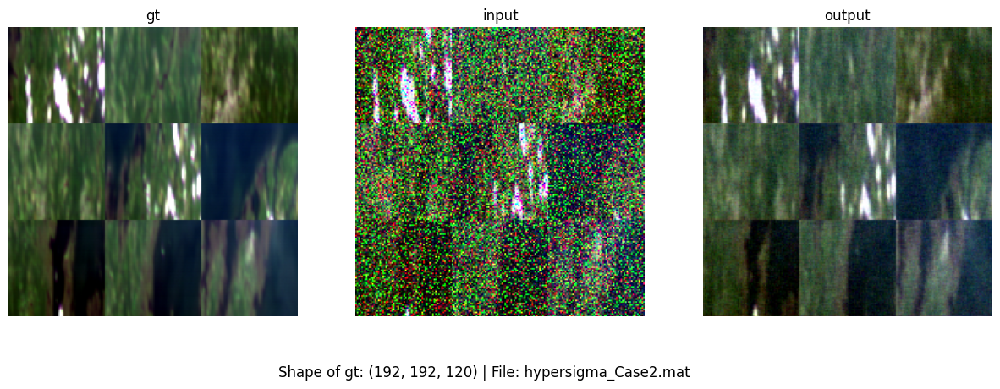

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6829991340637207..1.6766541004180908].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09904170781373978..1.1108201742172241].


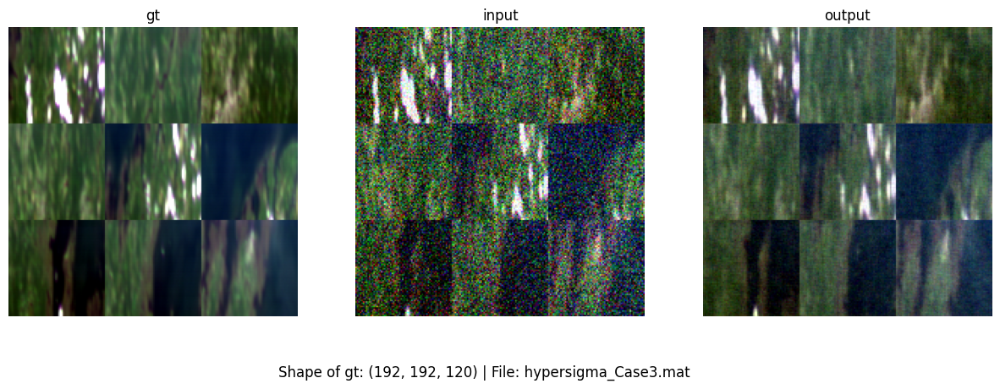

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0498576164245605..2.110947370529175].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1121591255068779..1.2028632164001465].


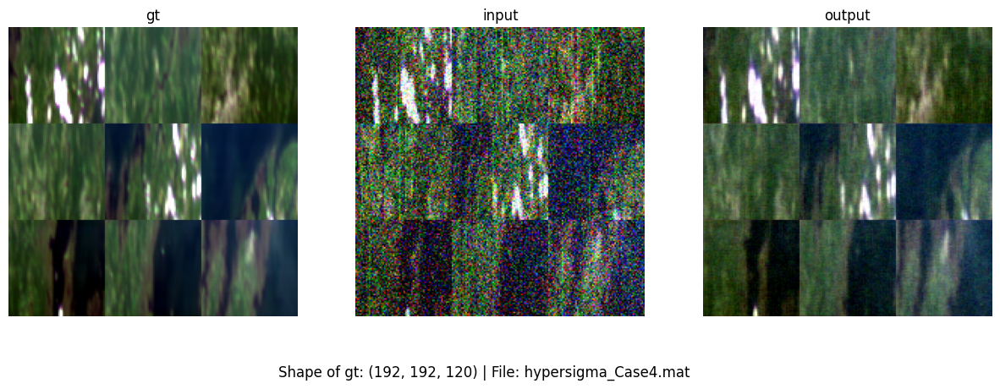

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6077049970626831..1.756643295288086].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12458214163780212..1.1881848573684692].


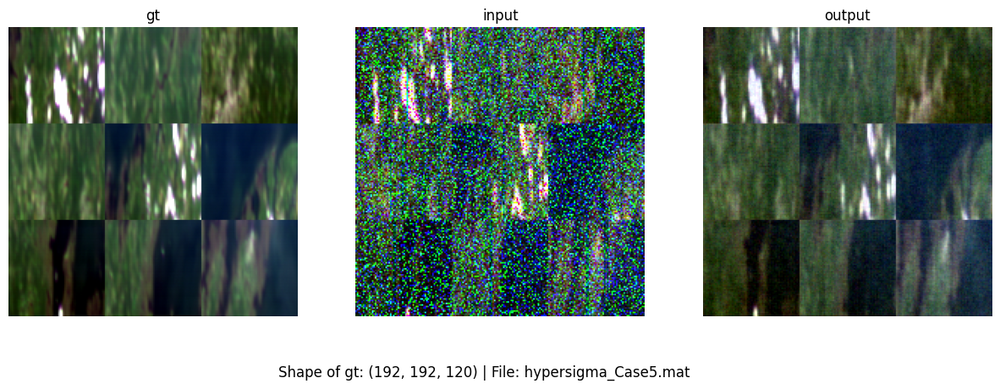

In [5]:
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/train_noise/Cases/Case5/train_0.mat', ['gt', 'input'])
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/results2/hypersigma/hypersigma_Case5.mat', ['gt', 'input', 'output'], output=True)

plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case1.mat', ['gt', 'input', 'output'], output=True)
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case2.mat', ['gt', 'input', 'output'], output=True)
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case3.mat', ['gt', 'input', 'output'], output=True)
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case4.mat', ['gt', 'input', 'output'], output=True)
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/HYPSO2/results/hypersigma/hypersigma_Case5.mat', ['gt', 'input', 'output'], output=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3754329681396484..2.211869955062866].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13894705474376678..1.1239591836929321].


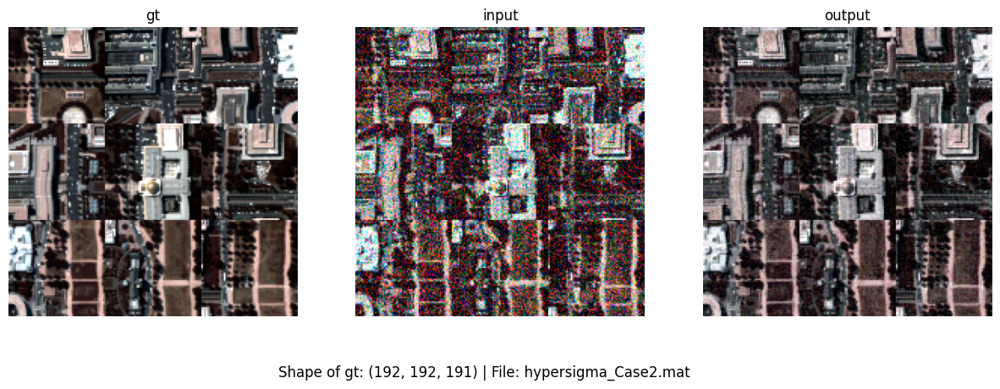

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6852670311927795..1.6641799211502075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14515969157218933..1.1071648597717285].


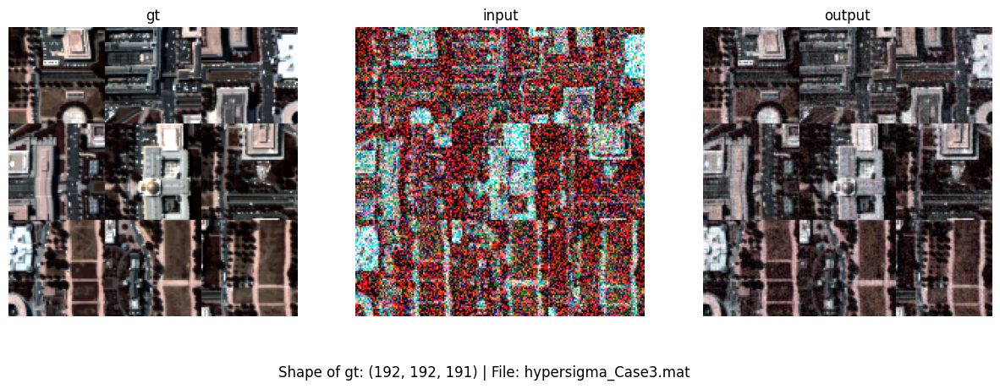

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3295655250549316..2.040834903717041].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1464952528476715..1.135345697402954].


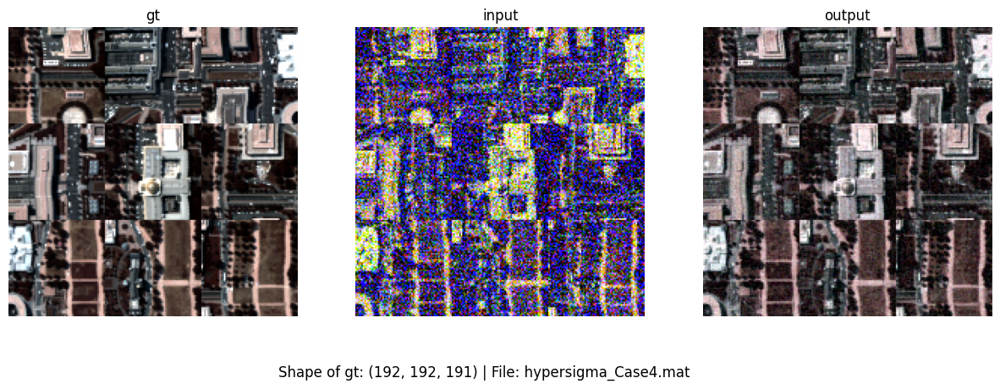

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.225819706916809..2.1702232360839844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12518316507339478..1.0881476402282715].


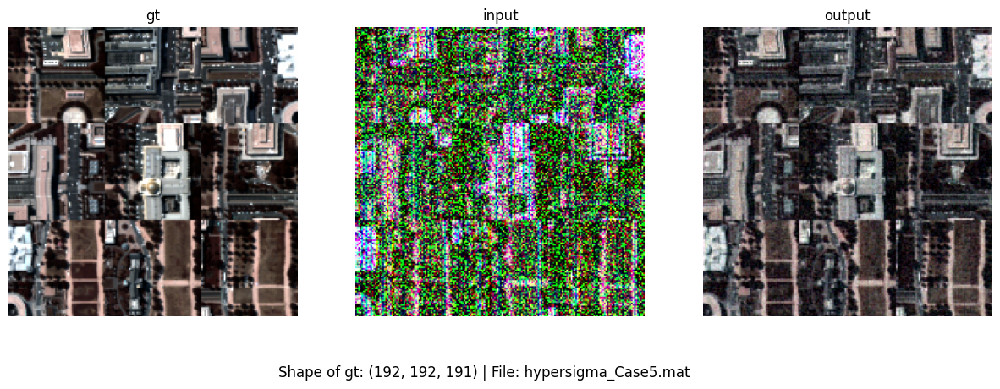

In [56]:
plot_rgb_composite('./data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case2.mat',
    keys=['gt', 'input', 'output'],
    red_band=30, green_band=20, blue_band=10, output=True
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case3.mat',
    keys=['gt', 'input', 'output'],
    red_band=30, green_band=20, blue_band=10, output=True
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case4.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10, output=True
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case5.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10, output=True
)

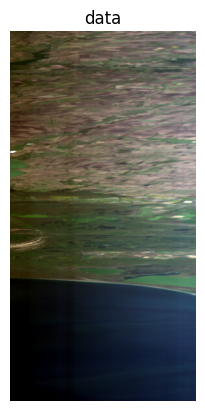

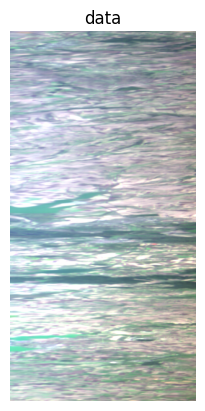

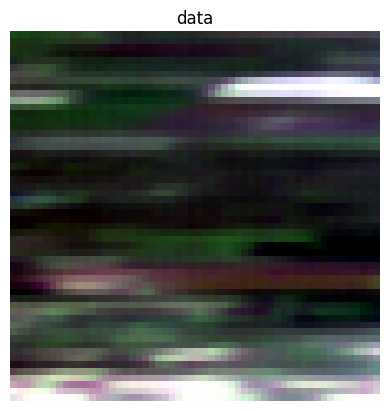

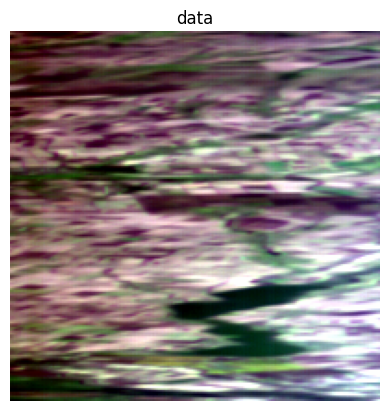

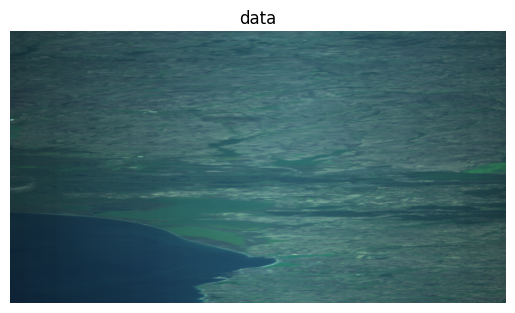

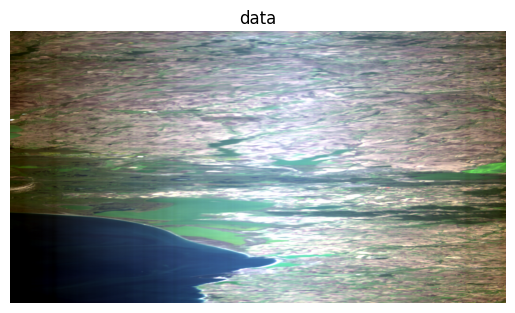

In [21]:
plot_rgb_composite(gloria_path+'train/train_0.mat', ['data'])
plot_rgb_composite(gloria_path+'train/train_1.mat', ['data'])
plot_rgb_composite(gloria_path+'val/val.mat', ['data'])
plot_rgb_composite(gloria_path+'test/test.mat', ['data'])
plot_rgb_composite(gloria_mat, ['data'])
plot_rgb_composite(gloria_Q_mat, ['data'])

In [20]:
gloria_cases = ['Case1', 'Case2', 'Case3', 'Case4', 'Case5']
for case in gloria_cases:
    plot_rgb_composite(
        f'{gloria_path}test_noise/Cases/{case}/test.mat',
        keys=['gt', 'input'],
        output=False
    )

gloria_patch_cases = ['Case1', 'Case2', 'Case3', 'Case4', 'Case5']
for case in gloria_patch_cases:
    plot_rgb_composite(
        f'{gloria_path}test_noise/Patch_Cases/{case}/test_0.mat',
        keys=['gt', 'input'],
        output=False
    )


NameError: name 'gloria_path' is not defined

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5998232960700989..1.5815914869308472].


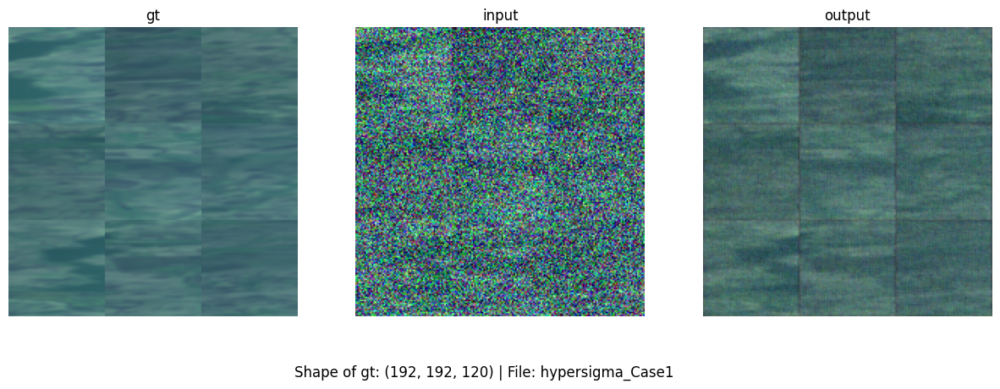

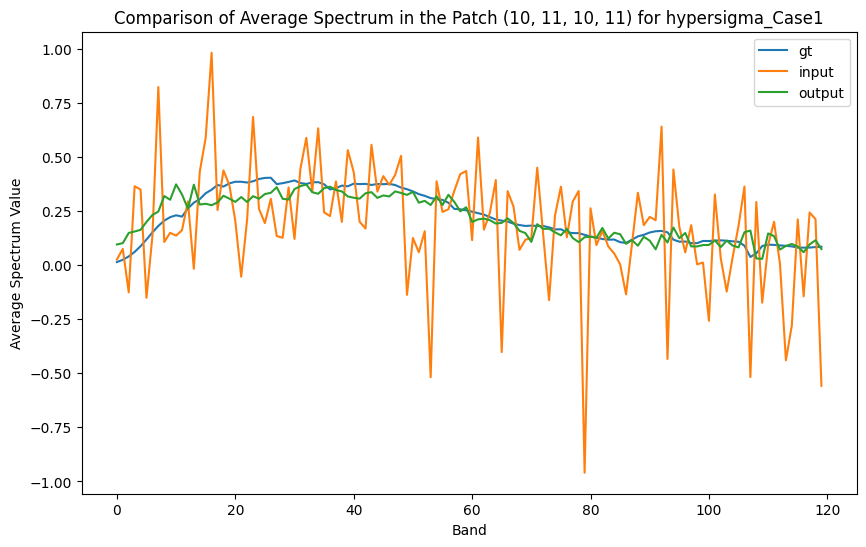

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0014804601669312..1.5897818803787231].


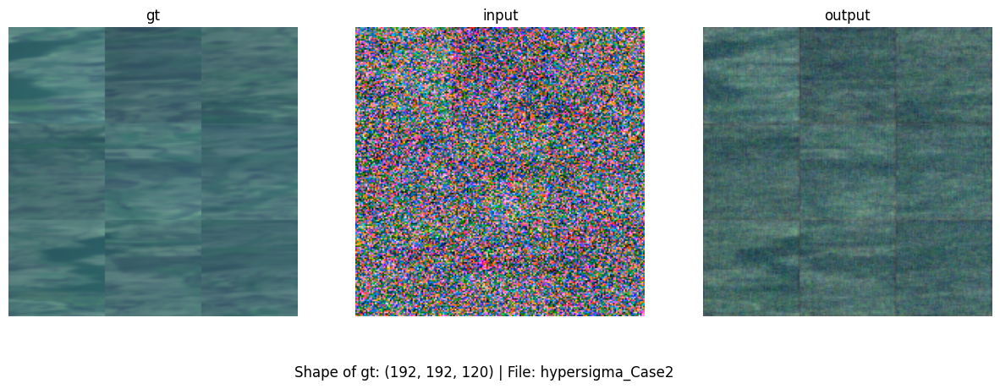

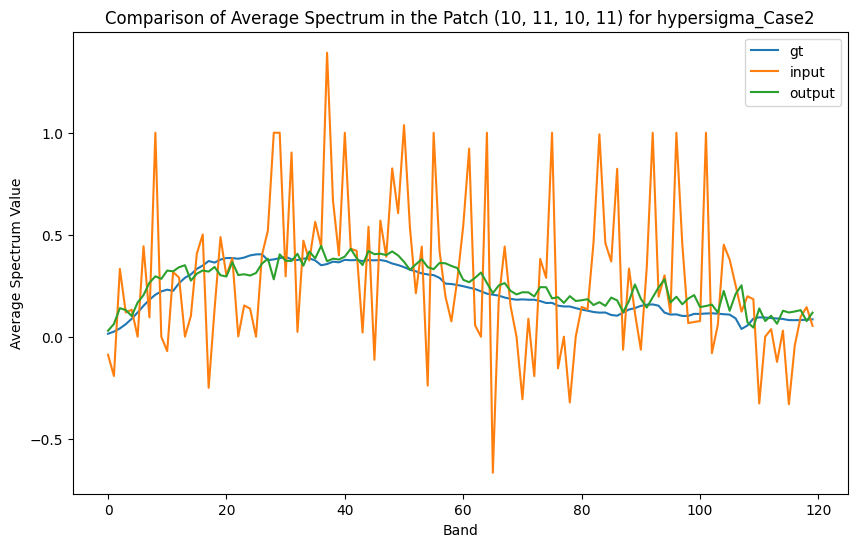

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8246636986732483..1.3493562936782837].


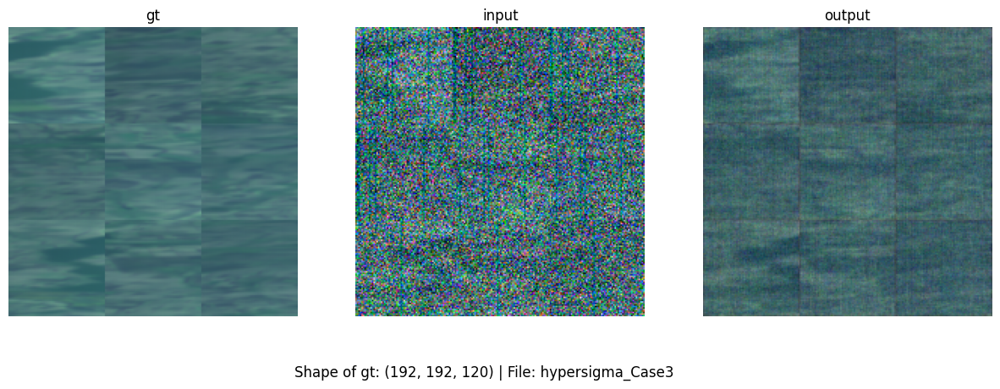

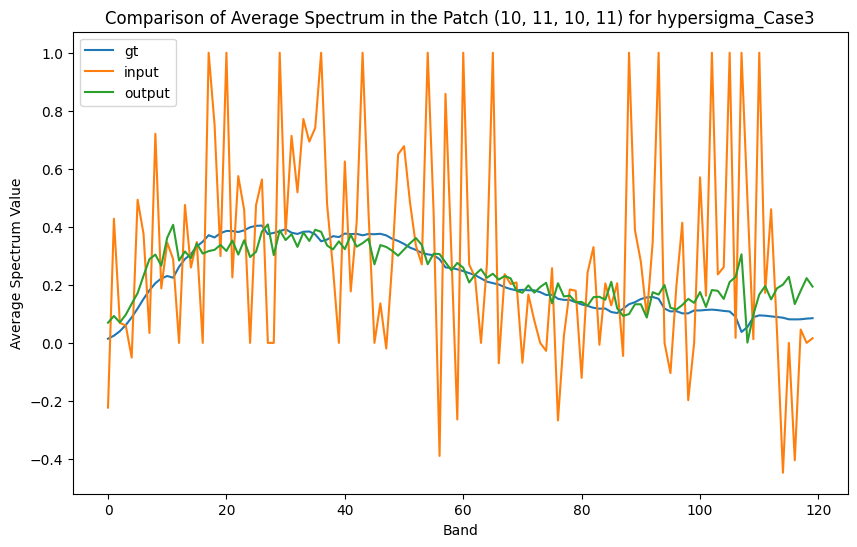

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2094250917434692..1.6491013765335083].


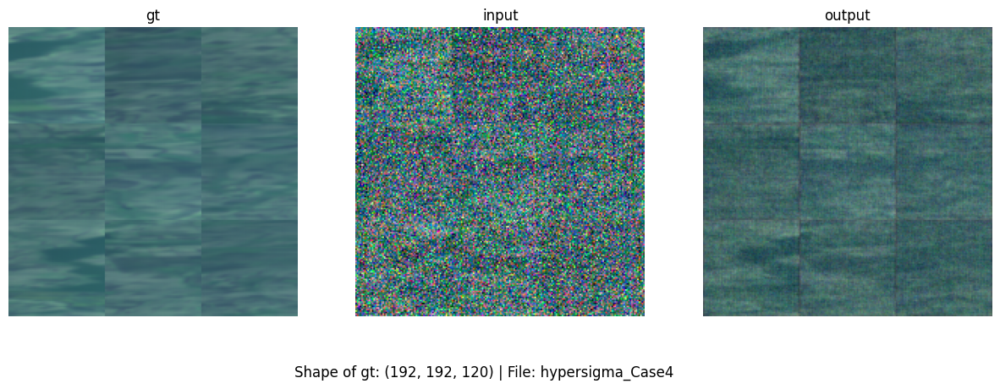

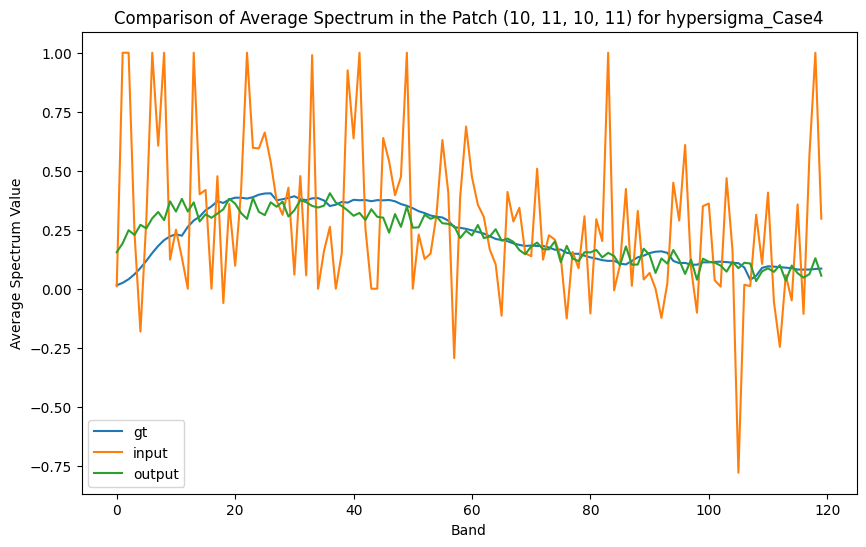

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.305650234222412..1.639162540435791].


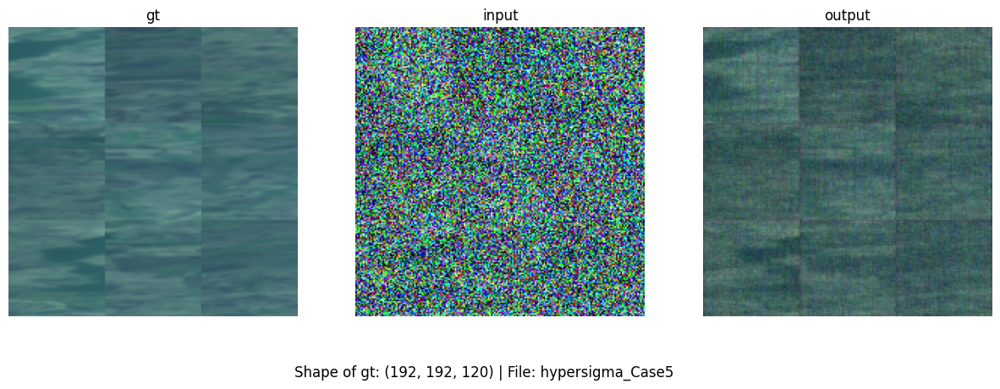

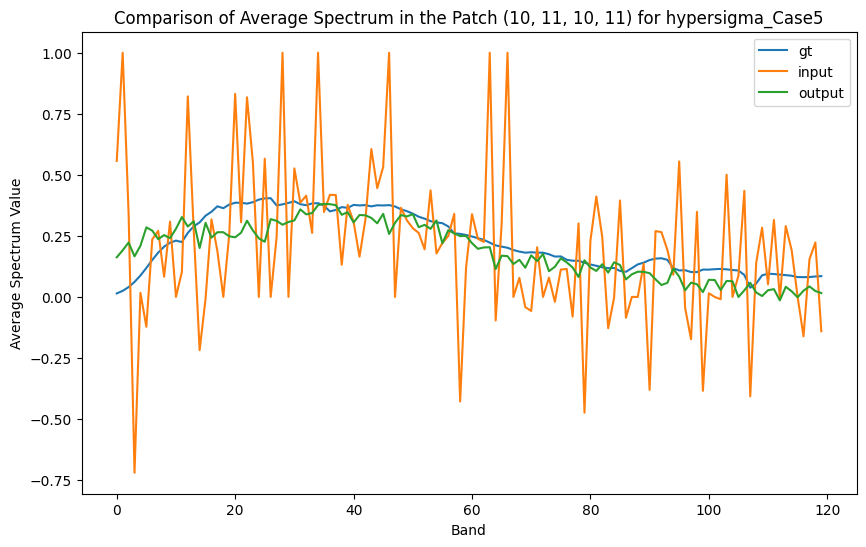

In [42]:
patch_coords = (10, 11, 10, 11)
plot_rgb_composite(gloria_path+'results/hypersigma/hypersigma_Case1', keys=['gt', 'input', 'output'],output=True)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case1', 'gt', 'input', key3='output', patch_coords=patch_coords)
plot_rgb_composite(gloria_path+'results/hypersigma/hypersigma_Case2', keys=['gt', 'input', 'output'],output=True)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case2', 'gt', 'input', key3='output', patch_coords=patch_coords)
plot_rgb_composite(gloria_path+'results/hypersigma/hypersigma_Case3', keys=['gt', 'input', 'output'],output=True)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case3', 'gt', 'input', key3='output', patch_coords=patch_coords)
plot_rgb_composite(gloria_path+'results/hypersigma/hypersigma_Case4', keys=['gt', 'input', 'output'],output=True)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case4', 'gt', 'input', key3='output', patch_coords=patch_coords)
plot_rgb_composite(gloria_path+'results/hypersigma/hypersigma_Case5', keys=['gt', 'input', 'output'],output=True)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case5', 'gt', 'input', key3='output', patch_coords=patch_coords)

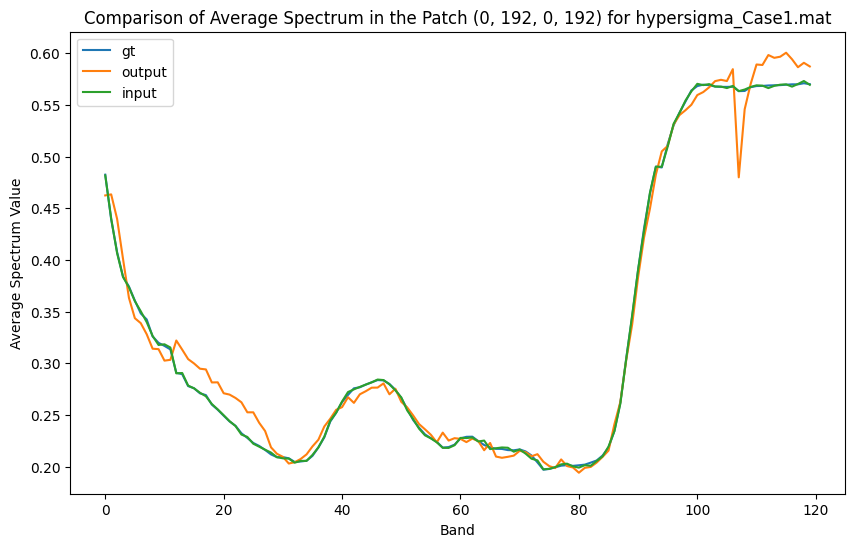

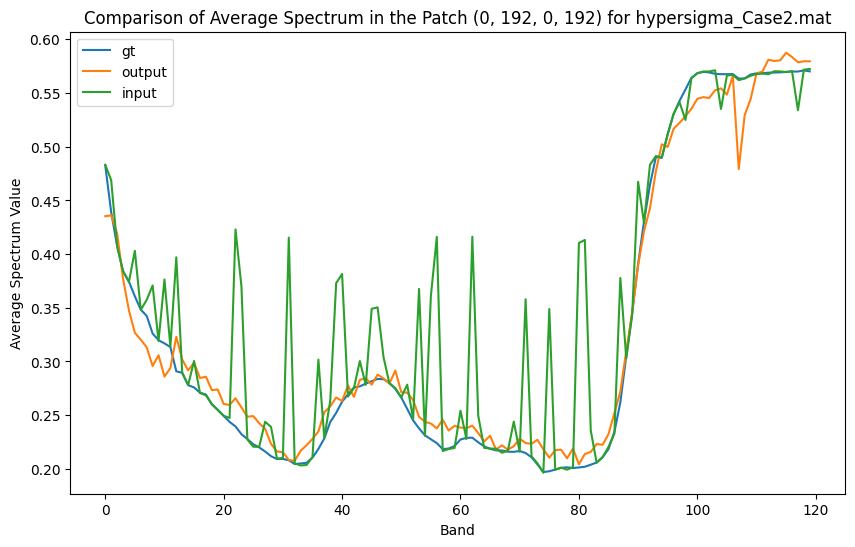

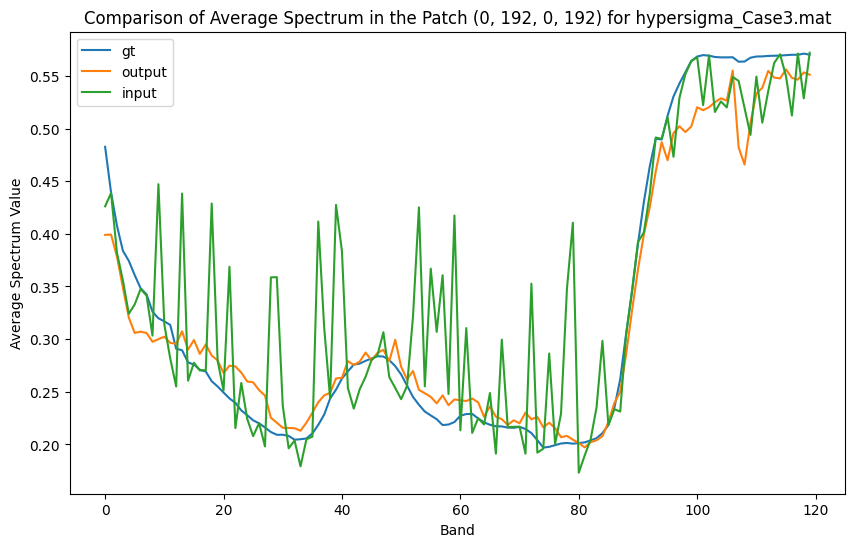

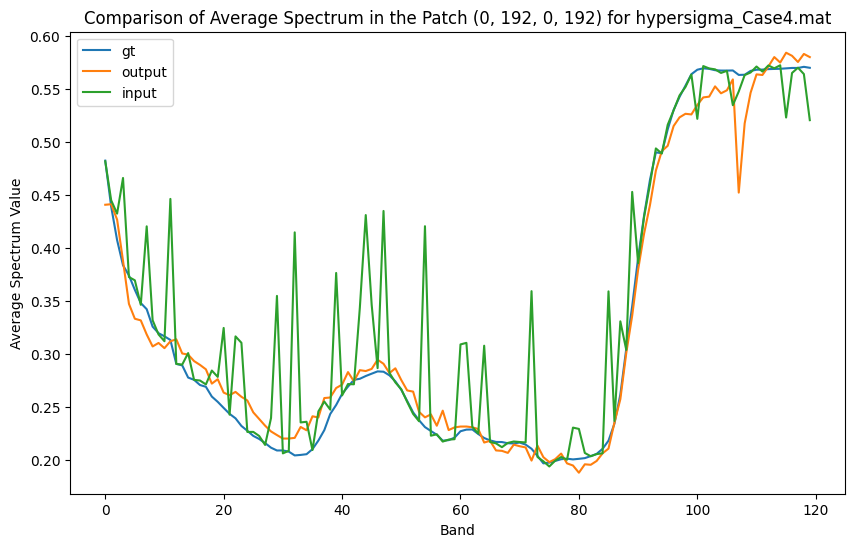

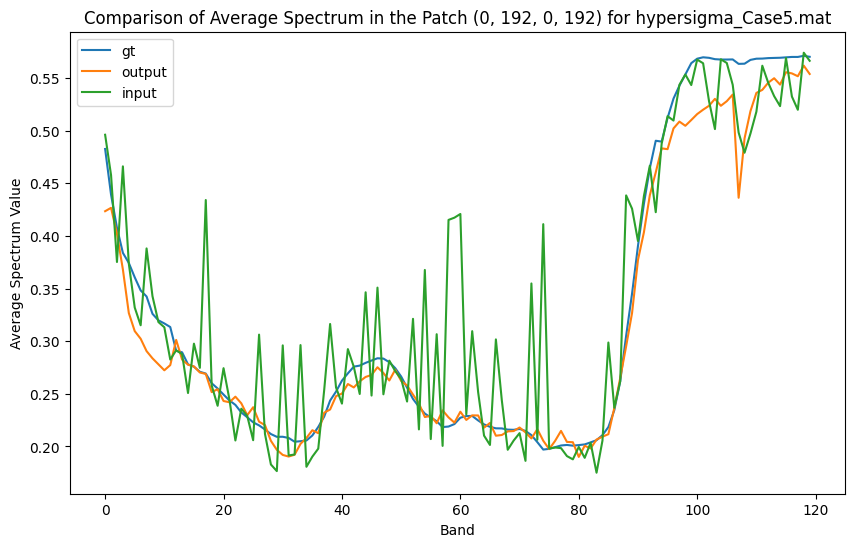

In [26]:
patch_coords = None
compare_average_spectrum(hypso_result_case1, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case2, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case3, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case4, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case5, 'gt', 'output', key3='input', patch_coords=patch_coords)

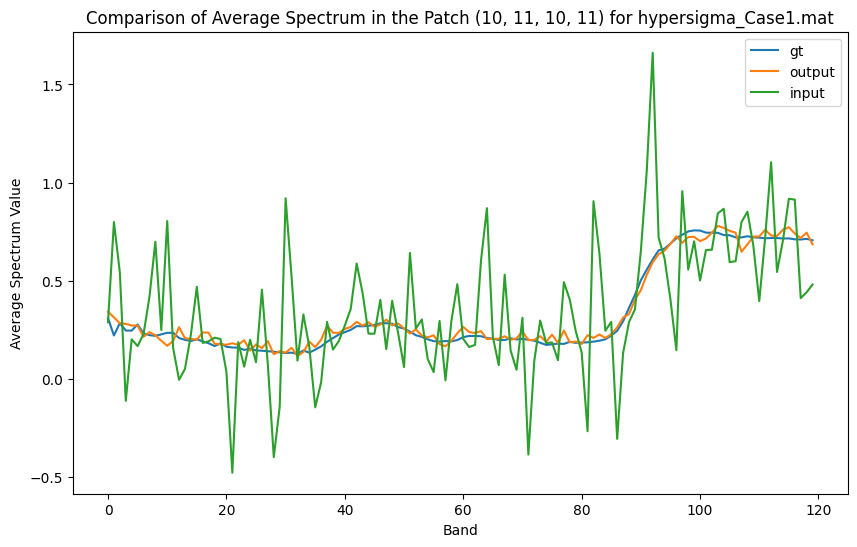

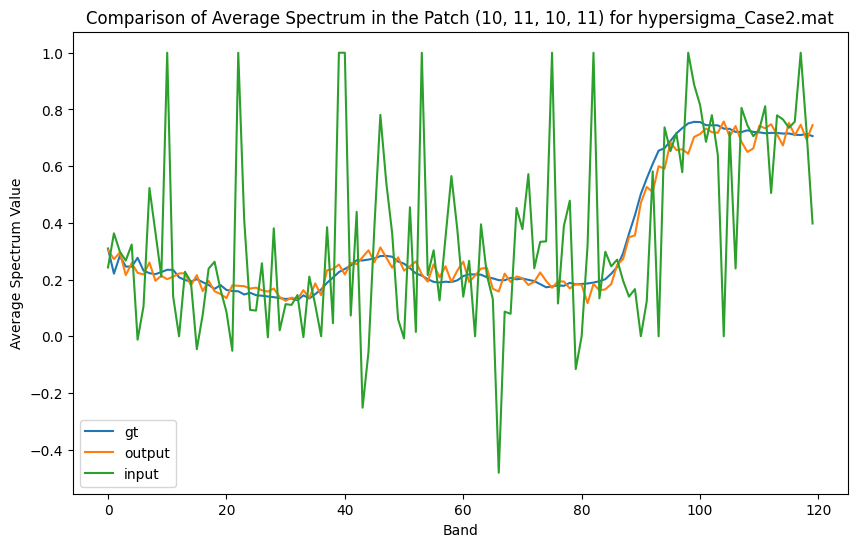

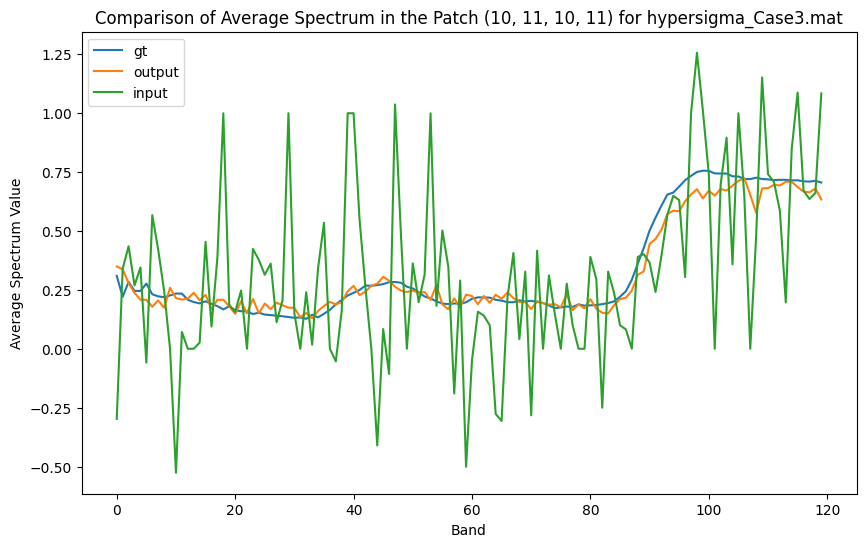

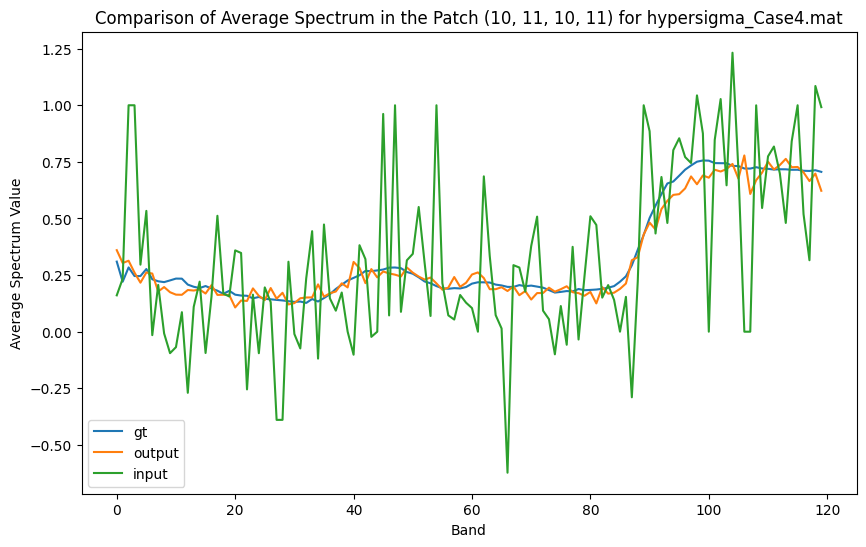

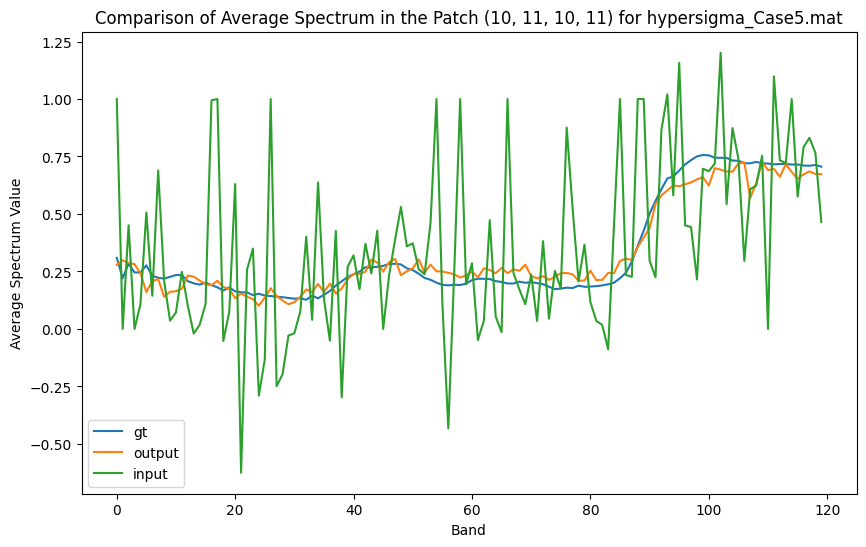

In [27]:
patch_coords = (10, 11, 10, 11)
compare_average_spectrum(hypso_result_case1, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case2, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case3, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case4, 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(hypso_result_case5, 'gt', 'output', key3='input', patch_coords=patch_coords)

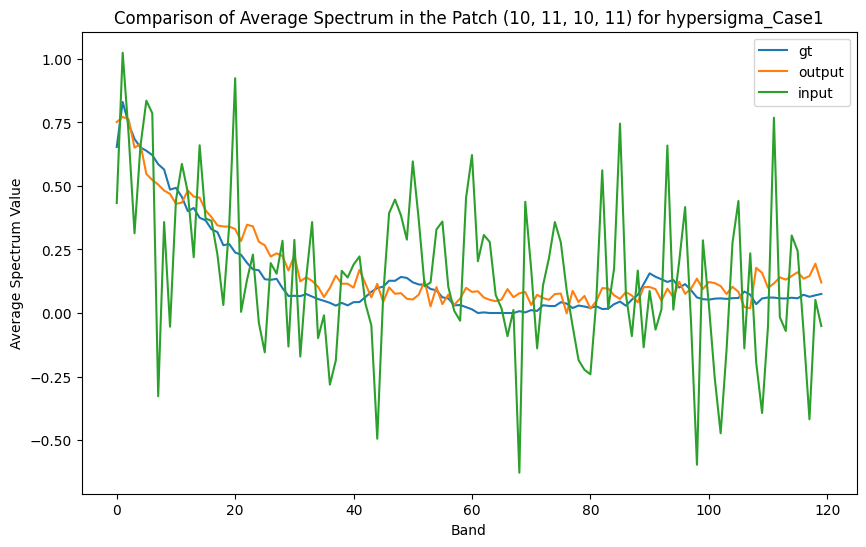

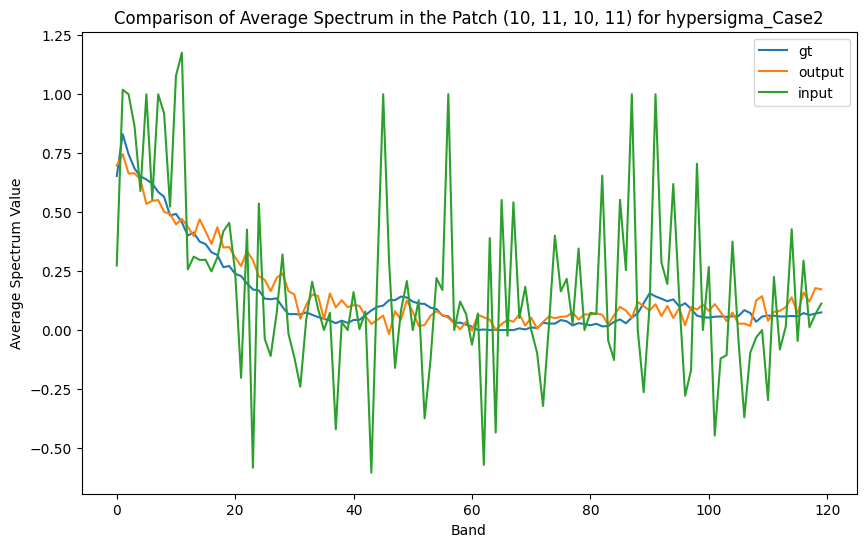

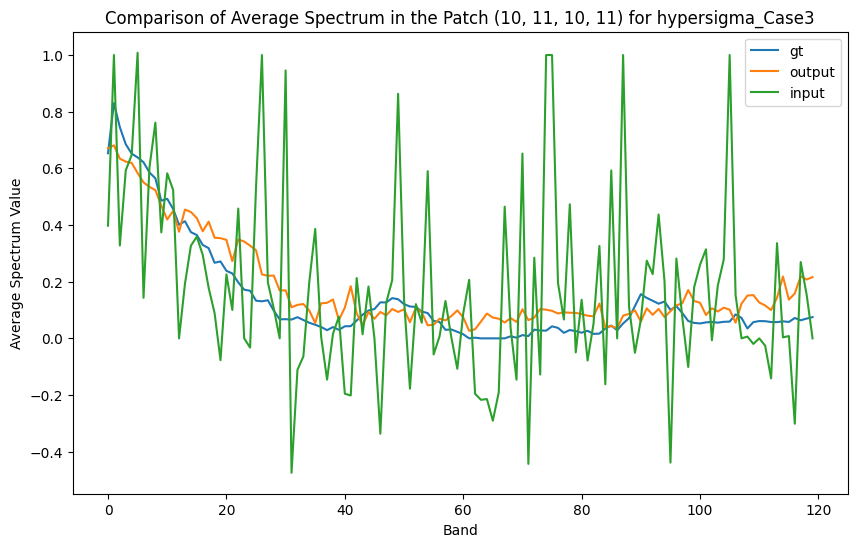

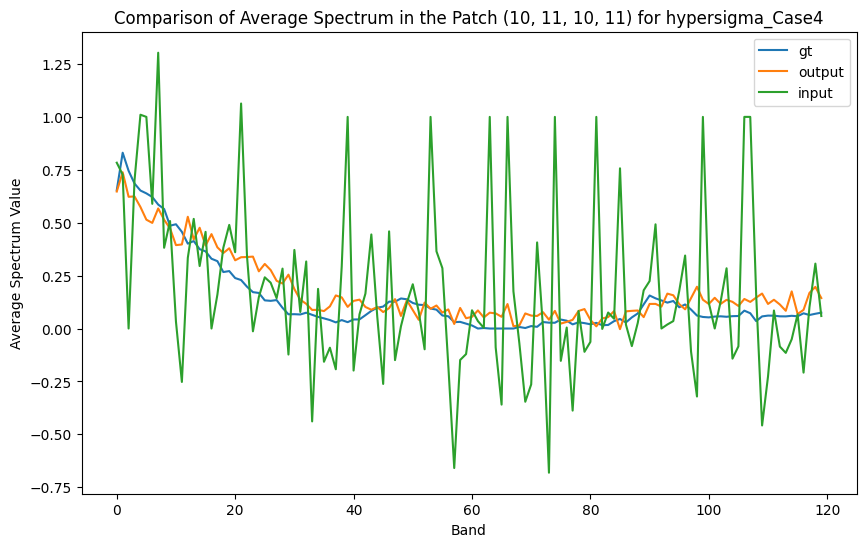

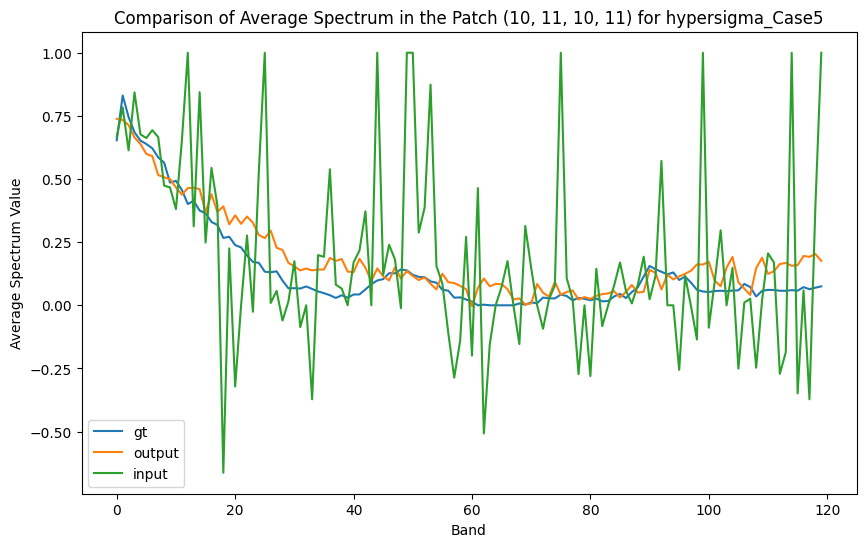

In [28]:
patch_coords = (10, 11, 10, 11)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case1', 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case2', 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case3', 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case4', 'gt', 'output', key3='input', patch_coords=patch_coords)
compare_average_spectrum(gloria_path+'results/hypersigma/hypersigma_Case5', 'gt', 'output', key3='input', patch_coords=patch_coords)

In [ ]:
slice_names = ['Background', 'Test Slice', 'Train Slice 0', 'Train Slice 1', 'Validation Slice']
slices = [
    (0, 191, 600, 800, 50, 250),  # Test slice
    (0, 191, 0, 600, 0, 307),     # Train slice 0
    (0, 191, 800, 1280, 0, 307),  # Train slice 1
    (0, 191, 600, 656, 251, 307)  # Validation slice
]
shape = (191, 1280, 307)

visualize_slices(shape, slices, slice_names)

slices = [
    (0, 120, 600, 800, 50, 250),  # Test slice
    (0, 120, 0, 600, 0, 598),     # Train slice 0
    (0, 120, 800, 1092, 0, 598),  # Train slice 1
    (0, 120, 600, 656, 251, 307)  # Validation slice
]
shape = (120, 1092, 598)
visualize_slices(shape, slices, slice_names)
slices = [
    (0, 120, 0, 598, 0, 300),       # Train slice 1
    (0, 120, 0, 598, 600, 900),     # Train slice 0
    (0, 120, 100, 300, 350, 550),   # Test slice
    (0, 120, 300, 356, 400, 456)    # Validation slice
]
shape = (120, 598, 1092)
visualize_slices(shape, slices, slice_names)

In [ ]:
plot_pixel_spectra(gloria_mat, (100, 100))

plot_pixel_spectra(gloria_mat, average_all=True)
plot_pixel_spectra(gloria_Q_mat, average_all=True)
plot_pixel_spectra(gloria_simple_mat, average_all=True)
plot_pixel_spectra(dc_mat, average_all=True)